In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import pickle
import numpy as np
from sklearn.preprocessing import StandardScaler, MinMaxScaler, QuantileTransformer
from sklearn.ensemble import HistGradientBoostingRegressor as hgbr
from sklearn.linear_model import Lasso
from sklearn.metrics import r2_score as r2 
import shap

c:\Users\Steven\Desktop\school github repos\svo-directed-practicum\.venv\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
# Open the pickle file
df = pickle.load(open('../../data/processed/merged_data_202507062100_long.pkl', 'rb'))
df

,ticker,Time,Last,Volume,Change_Last,Change_Volume,AAL_Change_High-Low_lag01,AAL_Change_High-Low_ma04_lag01,AAL_Change_High-Low_ma08_lag01,AAL_Change_High-Low_ma16_lag01,...,UAL_Change_PCA_Word_4_lag22,UAL_Change_PCA_Word_4_cum16_lag22,UAL_Change_PCA_Word_4_lag23,UAL_Change_PCA_Word_4_cum16_lag23,UAL_Change_PCA_Word_4_lag24,UAL_Change_PCA_Word_4_cum16_lag24,UAL_Change_PCA_Word_4_lag25,UAL_Change_PCA_Word_4_cum16_lag25,UAL_Change_PCA_Word_4_lag26,UAL_Change_PCA_Word_4_cum16_lag26
27,AAL,2018-01-03 09:45:00,52.3,178545.0,-0.14,-77718.0,0.2600,0.097500,0.032500,0.013750,...,-26.159660,0.000000,26.159660,26.159660,-181.223450,0.000000,181.223450,155.117157,-31.756311,0.000000
28,AAL,2018-01-03 10:00:00,52.39,129775.0,0.09,-48770.0,-0.1000,0.060000,0.026250,0.017812,...,0.000000,0.000000,-26.159660,0.000000,26.159660,26.159660,-181.223450,0.000000,181.223450,155.117157
29,AAL,2018-01-03 10:15:00,52.49,57301.0,0.1,-72474.0,-0.1000,0.037500,0.021250,0.007500,...,0.000000,0.000000,0.000000,0.000000,-26.159660,0.000000,26.159660,26.159660,-181.223450,0.000000
30,AAL,2018-01-03 10:30:00,52.31,874095.0,-0.18,816794.0,-0.1300,-0.017500,0.002500,-0.001875,...,61.139420,-56.561181,0.000000,0.000000,0.000000,0.000000,-26.159660,0.000000,26.159660,26.159660
31,AAL,2018-01-03 10:45:00,52.23,199000.0,-0.08,-675095.0,0.1300,-0.050000,0.023750,0.006875,...,-61.139420,0.000000,61.139420,-56.561181,0.000000,0.000000,0.000000,0.000000,-26.159660,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
337962,UAL,2025-05-30 14:45:00,79.48,144655.0,0.23,25287.0,-0.0390,0.002425,-0.006287,-0.001269,...,-64.646294,-638.603108,35.922150,2.148326,-7.002450,9.283429,-1.707564,-41.397628,-4.739039,-13.755102
337963,UAL,2025-05-30 15:00:00,79.52,169821.0,0.04,25166.0,0.0103,0.000500,0.002500,0.000000,...,22.142059,20.856115,-64.646294,-638.603108,35.922150,2.148326,-7.002450,9.283429,-1.707564,-41.397628
337964,UAL,2025-05-30 15:15:00,79.91,402686.0,0.39,232865.0,-0.0100,-0.006225,-0.010000,0.000000,...,4.193312,26.335372,22.142059,20.856115,-64.646294,-638.603108,35.922150,2.148326,-7.002450,9.283429
337965,UAL,2025-05-30 15:30:00,79.76,232344.0,-0.15,-170342.0,0.0100,-0.007175,0.001250,-0.002188,...,-26.335373,0.000000,4.193312,26.335372,22.142059,20.856115,-64.646294,-638.603108,35.922150,2.148326


In [3]:
df.columns.tolist()

['ticker',
 'Time',
 'Last',
 'Volume',
 'Change_Last',
 'Change_Volume',
 'AAL_Change_High-Low_lag01',
 'AAL_Change_High-Low_ma04_lag01',
 'AAL_Change_High-Low_ma08_lag01',
 'AAL_Change_High-Low_ma16_lag01',
 'AAL_Change_High-Low_ma26_lag01',
 'AAL_Change_Last-Open_lag01',
 'AAL_Change_Last-Open_ma04_lag01',
 'AAL_Change_Last-Open_ma08_lag01',
 'AAL_Change_Last-Open_ma16_lag01',
 'AAL_Change_Last-Open_ma26_lag01',
 'AAL_Change_Last_lag01',
 'AAL_Change_Last_lag02',
 'AAL_Change_Last_lag03',
 'AAL_Change_Last_lag04',
 'AAL_Change_Last_lag05',
 'AAL_Change_Last_lag06',
 'AAL_Change_Last_lag07',
 'AAL_Change_Last_lag08',
 'AAL_Change_Last_lag09',
 'AAL_Change_Last_lag10',
 'AAL_Change_Last_lag11',
 'AAL_Change_Last_lag12',
 'AAL_Change_Last_lag13',
 'AAL_Change_Last_lag14',
 'AAL_Change_Last_lag15',
 'AAL_Change_Last_lag16',
 'AAL_Change_Last_lag17',
 'AAL_Change_Last_lag18',
 'AAL_Change_Last_lag19',
 'AAL_Change_Last_lag20',
 'AAL_Change_Last_lag21',
 'AAL_Change_Last_lag22',
 'AAL_Cha

In [4]:
# Data preprocessing

y_cols = ['Change_Volume']
#x_cols = [
#        'day_of_week_0','day_of_week_1','day_of_week_2','day_of_week_3','day_of_week_4','month_of_year_1','month_of_year_2','month_of_year_3','month_of_year_4',#'month_of_year_5','month_of_year_6','month_of_year_7','month_of_year_8','month_of_year_9','month_of_year_10','month_of_year_11','month_of_year_12','hour_of_day_9',#'hour_of_day_10','hour_of_day_11','hour_of_day_12','hour_of_day_13','hour_of_day_14','hour_of_day_15',
#        'is_open','is_close'
#        ]

y = df[y_cols]
#x = df[x_cols]
x = df.copy()
x.drop(columns=['ticker','Time','Last','Volume','Change_Last','Change_Volume'], inplace=True)

In [6]:
[i for i in x.columns if 'lag' not in i]

[]

In [7]:
# Train/test splitting
split_val  = round(0.7 * len(x))
split_test = round(0.9 * len(x))

x_train = x[:split_val]
x_val   = x[split_val:split_test]
x_test  = x[split_test:]

y_train = y[:split_val]
y_val   = y[split_val:split_test]
y_test  = y[split_test:]

In [8]:
# Normalize the features to [0,1]
sc2 = MinMaxScaler(feature_range=(0, 1))

x_train = sc2.fit_transform(x_train)
x_val   = sc2.transform(x_val)
x_test  = sc2.transform(x_test)

In [9]:
x_train.shape

(33796, 11046)

In [10]:
model = hgbr(
    learning_rate=0.1,
    min_samples_leaf=100,
    l2_regularization=0,
    #max_features=0.1,
    max_features=1.0,
    max_leaf_nodes=None,
    max_depth=None,
    early_stopping=True,
    scoring='r2',
    n_iter_no_change=20,
    verbose=2,
    max_iter = 200,
    random_state=42
)

model.fit(x_train, y_train, 
          X_val=x_val, y_val=y_val)

c:\Users\Steven\Desktop\school github repos\svo-directed-practicum\.venv\Lib\site-packages\sklearn\utils\validation.py:1406: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
c:\Users\Steven\Desktop\school github repos\svo-directed-practicum\.venv\Lib\site-packages\sklearn\utils\validation.py:1406: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Binning 2.986 GB of training data: 7.320 s
Binning 0.853 GB of validation data: 1.028 s
Fitting gradient boosted rounds:
[1/200] 1 tree, 255 leaves, max depth = 13, train score: 0.15881, val score: 0.20897, in 4.306s
[2/200] 1 tree, 255 leaves, max depth = 13, train score: 0.28768, val score: 0.37498, in 4.082s
[3/200] 1 tree, 255 leaves, max depth = 13, train score: 0.39229, val score: 0.50647, in 4.119s
[4/200] 1 tree, 255 leaves, max depth = 13, train score: 0.47721, val score: 0.61032, in 3.965s
[5/200] 1 tree, 255 leaves, max depth = 13, train score: 0.54617, val score: 0.69204, in 4.016s
[6/200] 1 tree, 255 leaves, max depth = 13, train score: 0.60228, val score: 0.75233, in 3.980s
[7/200] 1 tree, 255 leaves, max depth = 13, train score: 0.64796, val score: 0.80298, in 4.009s
[8/200] 1 tree, 255 leaves, max depth = 13, train score: 0.68523, val score: 0.83980, in 3.945s
[9/200] 1 tree, 255 leaves, max depth = 13, train score: 0.71556, val score: 0.87062, in 3.989s
[10/200] 1 tree

,loss,'squared_error'
,quantile,None
,learning_rate,0.1
,max_iter,200
,max_leaf_nodes,None
,max_depth,None
,min_samples_leaf,100
,l2_regularization,0
,max_features,1.0
,max_bins,255
,categorical_features,'from_dtype'


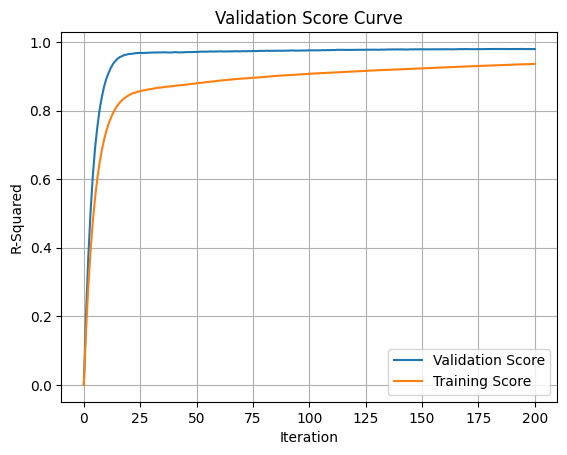

In [15]:
# Graph the training and validation loss
#plt.plot(model.loss_curve_)
plt.plot(model.validation_score_, label='Validation Score')
plt.plot(model.train_score_, label='Training Score')
plt.legend()
plt.grid()
plt.title('Validation Score Curve')
plt.xlabel('Iteration')
plt.ylabel('R-Squared')
plt.show()

In [16]:
model.score(x_val, y_val)

0.9795992336884779

In [17]:
model.score(x_test, y_test)

0.5789273267731455

In [31]:
model.score(x_train, y_train)

0.7892474366983224

In [18]:
y_pred = model.predict(x_val)
print(round(r2(y_val, y_pred), 3))

-3.13


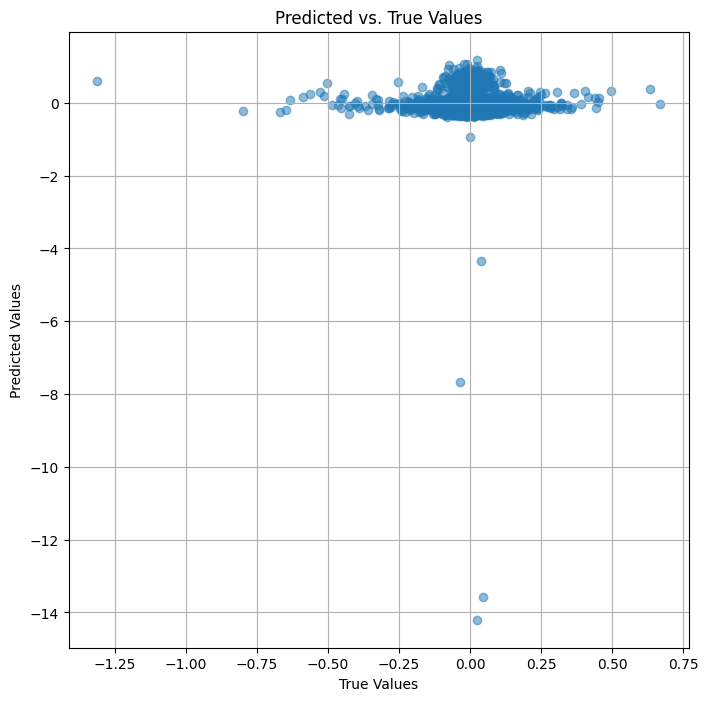

In [25]:
plt.figure(figsize=(8, 8))
plt.scatter(y_val.iloc[:,0], y_pred[:,0], alpha=0.5)
plt.xlabel("True Values")
plt.ylabel("Predicted Values")
plt.title("Predicted vs. True Values")
plt.grid(True)
plt.show()

In [26]:
y_val.iloc[:,0]

2023-03-08 14:30:00    0.0300
2023-03-08 14:45:00    0.0300
2023-03-08 15:00:00   -0.0100
2023-03-08 15:15:00   -0.0200
2023-03-08 15:30:00    0.0100
                        ...  
2024-08-30 11:00:00   -0.0551
2024-08-30 11:15:00   -0.0199
2024-08-30 11:30:00   -0.0450
2024-08-30 11:45:00   -0.0500
2024-08-30 12:00:00   -0.0150
Name: AAL_Change_Open, Length: 9656, dtype: float64

In [160]:
x_val[0]

array([3.66980068e-01, 4.93728607e-01, 5.01999073e-01, 3.73897218e-01,
       4.88884033e-01, 4.90049617e-01, 5.00306373e-01, 4.05262899e-01,
       4.19051083e-01, 3.95219446e-01, 4.61962683e-01, 4.96588018e-01,
       4.88916508e-01, 4.60406956e-01, 4.96140307e-01, 5.02901978e-01,
       4.50757348e-01, 4.51821663e-01, 5.15323990e-01, 4.26765505e-01,
       0.00000000e+00, 0.00000000e+00, 1.00000000e+00, 0.00000000e+00,
       0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 1.00000000e+00,
       0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
       0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
       0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
       0.00000000e+00, 0.00000000e+00, 1.00000000e+00, 0.00000000e+00,
       0.00000000e+00, 0.00000000e+00, 2.75440705e-01, 4.38356164e-01,
       3.82255639e-01, 3.85040374e-01, 3.96133094e-01, 3.82762487e-01,
       3.90296365e-01, 3.47617445e-01, 3.83356287e-01, 4.02591600e-01,
      

In [159]:
y_pred

array([  43233.00469993,  -66739.58639703,  -90750.87097692, ...,
        183471.05816173, -247595.83811078, -106768.80970552])

In [121]:
# random sample of x_val
x_sample = pd.DataFrame(x_val[np.random.choice(x_val.shape[0], 100, replace=False)], columns=x_cols)

kernel_explainer = shap.KernelExplainer(model.predict, x_sample, seed=1234)
shap_values = kernel_explainer(x_sample)

100%|██████████| 100/100 [02:16<00:00,  1.37s/it]


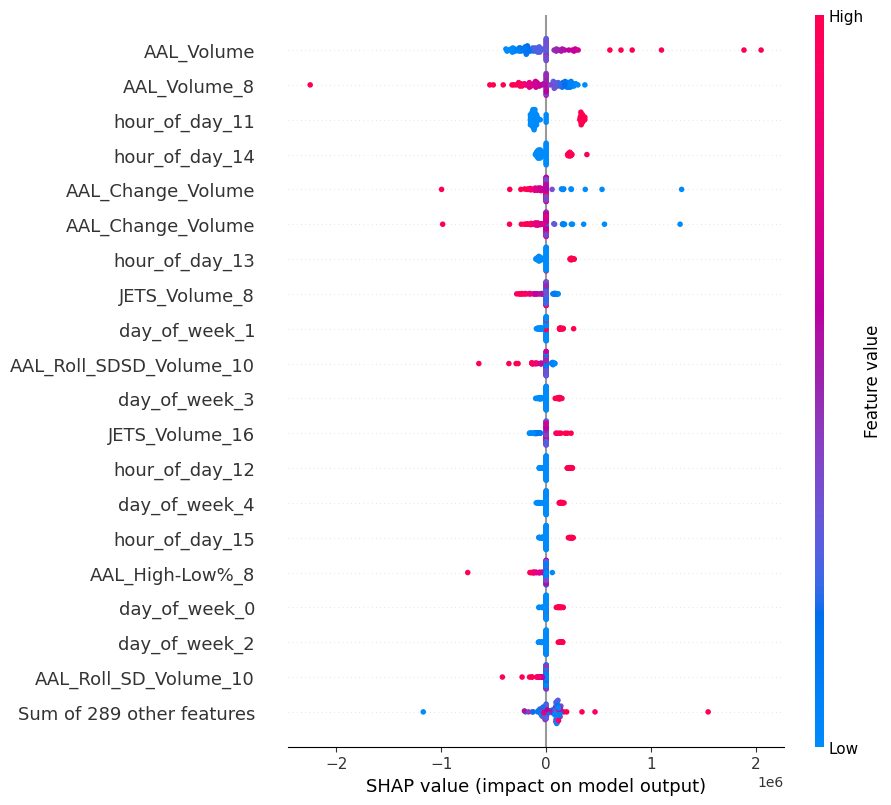

In [122]:
shap.plots.beeswarm(shap_values, max_display=20)